### Laboratorium 9 - zadania

Rozpakuj dołączone archiwum `dataset.zip` w folderze z notebookiem przed rozpoczęciem pracy.  
Potrzebne Ci będą pakiety `scikit-learn` i `scikit-image` - doinstaluj, jeśli jeszcze nie posiadasz.

Na tym laboratorium przetestujesz uproszczoną wersję detektora Violi-Jonesa dla obrazów twarzy. Uproszczenie polegało będzie na tym, że nie będziemy stosować pełnego pipeline'u kaskadowego, gdyż jego nauczenie jest dość skomplikowanym i długotrwałym procesem. Zastosowanie takiego gotowego detektora jest banalnie proste, dlatego internet roi się od lepszych i gorszych tutoriali. Dobre przykłady znajdziesz w dokumentacji [scikit-image](https://scikit-image.org/docs/dev/auto_examples/applications/plot_face_detection.html) oraz [OpenCV](https://docs.opencv.org/4.5.4/db/d28/tutorial_cascade_classifier.html) - na obu stronach znajdziesz także pliki konfiguracyjne dla nauczonych detektorów.

Funkcje (linki do dokumentacji), które należy mieć pod ręką na tym laboratorium:
* [`skimage.transform.integral_image`](https://scikit-image.org/docs/dev/api/skimage.transform.html?highlight=integral_image#skimage.transform.integral_image)
* [`skimage.feature.haar_like_feature`](https://scikit-image.org/docs/stable/api/skimage.feature.html#haar-like-feature) - oblicza (opcjonalnie: wybrane) cechy Haara dla podanego obrazu całkowego
* [`skimage.feature.haar_like_feature_coord`](https://scikit-image.org/docs/stable/api/skimage.feature.html#haar-like-feature-coord) - wylicza koordynaty cech Haara
* [`skimage.feature.draw_haar_like_feature`](https://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.draw_haar_like_feature) - rysuje cechy Haara o podanych koordynatach
* [`sklearn.ensemble.AdaBoostClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html)

Przykładów użycia nie zamieszczam w instrukcji bo są świetne w dokumentacji.

In [1]:
import os
import time
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import integral_image
from skimage.feature import haar_like_feature
from sklearn.ensemble import AdaBoostClassifier
import sklearn.tree

Poniższa komórka wczyta cały dataset w postaci pary (lista obrazów, lista etykiet). Obrazy skonwertuje od razu do skali szarości, ale skalowanie musisz wykonać własnoręcznie.

In [2]:
def read_folder(path):
    return list(cv2.imread(item.path, flags=cv2.IMREAD_GRAYSCALE) for item in os.scandir(path))

positive_images = read_folder('natural_images_postprocessed/face')
negative_images = read_folder('natural_images_postprocessed/noface')

raw_images = positive_images + negative_images
raw_targets = np.asarray(list(1 for _ in positive_images ) + list(0 for _ in negative_images), dtype=np.int64)

Poniższa komórka ładuje obrazy testowe do części badawczej.

In [3]:
test_images = read_folder('test_images')

---

#### Zadanie 1 (0.5 pkt | 0.0 pkt)

Celem tego zadania jest nauczenie się korzystania z `haar_like_feature` i `haar_like_feature_coord`.

##### Zadanie 1a

Przetestuj pipeline do ekstrakcji cech Haara dla pojedynczego obrazu. Pamiętaj o skalowaniu! Sprawdź, ile cech otrzymujesz dla różnych skal pomiędzy 16x16 a 32x32. Zwróć uwagę, że `haar_like_feature` domyślnie ekstrahuje wszystkie możliwe cechy - być może wystarczą tylko niektóre z nich (np. tylko `type-2-x` i `type-2-y`).

(256, 256)


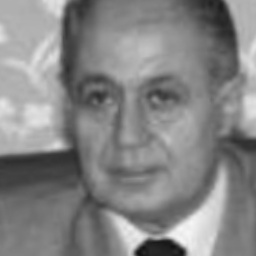

In [4]:
print(raw_images[0].shape)
Image.fromarray(raw_images[0])

In [5]:
feature_types = ['type-2-x', 'type-2-y']

def extract_feature_image(img, feature_type, feature_coord=None):
    """Extract the haar feature for the current image"""
    ii = integral_image(img)
    return haar_like_feature(ii, 0, 0, ii.shape[0], ii.shape[1],
                             feature_type=feature_type,
                             feature_coord=feature_coord)


def zad1(img, target_size=16):
    img = cv2.resize(img, (target_size, target_size))
    
    X = extract_feature_image(img, feature_types)
    
    print('Feature shape: ',X.shape)
    return Image.fromarray(img)

In [6]:
zad1(raw_images[0])

Feature shape:  (17280,)


In [7]:
zad1(raw_images[0], 19)

Feature shape:  (34020,)


In [8]:
zad1(raw_images[0], 25)

Feature shape:  (101088,)


Feature shape:  (269824,)


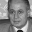

In [9]:
zad1(raw_images[0], 32)

##### Zadanie 1b 

Użyj `haar_like_feature_coord` do wyznaczenia koordynat cech Haara dla podanej konfiguracji (rozmiar obrazka, wybrane typy cech). Wartości zwracane przez tę funkcję to para (coords, types) w nieco dziwnym typie:
* coords to `np.array` o długości N=liczba cech, zawierający pythonowe listy dwuelementowe, zawierające punkty początkowy i końcowy prostokąta obejmującego daną cechę,
* types to `np.array` o długości N=liczba cech, zawierający stringi identyfikujące typ danej cechy.

Wybierz jedną dowolną cechę (na chybił trafił) i wyświetl ją używając `draw_haar_like_feature`.

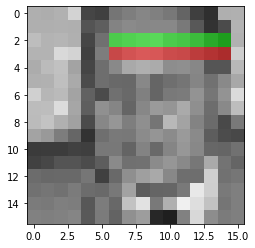

In [10]:
from skimage.feature import haar_like_feature_coord
from skimage.feature import draw_haar_like_feature

def zad1b(img, target_size=16, feature_types = ['type-2-x', 'type-2-y']):
    img = cv2.resize(img, (target_size, target_size))
    
    feat_coord, feat_type = haar_like_feature_coord(img.shape[0], img.shape[1], feature_types)
    
    image = draw_haar_like_feature(img,
                                   0, 0, img.shape[0], img.shape[1],
                                   feat_coord,
                                   max_n_features=1)
    return plt.imshow(image)
    
zad1b(raw_images[0], 16)

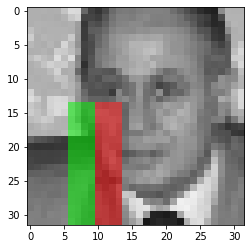

In [11]:

zad1b(raw_images[0], 32)

In [12]:
from tqdm import tqdm

---

#### Zadanie 2 (0.75 pkt | 0.25 pkt)

Dokonaj ekstrakcji cech Haara z całego datasetu. Dobierz parametry (skalowanie, typy cech) w taki sposób, by ekstrakcja nie trwała więcej niż 2-5 minut. Uformuj zbiory uczący i walidacyjny na potrzeby uczenia klasyfikatora, pamiętając o losowym samplowaniu z obu klas (np. używając [`sklearn.model_selection.train_test_split`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html)).
Wykonaj uczenie klasyfikatora AdaBoost na tym zbiorze, zaczynając od niewielkiej liczby korzeni (N=10), powtarzając 2-3 razy dla większych wartości - ten proces również nie powinien trwać dłużej niż minutę. Na każdym etapie sprawdź, które cechy zostały wybrane.

In [13]:
classifier = AdaBoostClassifier(n_estimators=3)

In [16]:
from sklearn.model_selection import train_test_split

def get_features(X, y, target_size=16, feature_types = ['type-2-x', 'type-2-y']): 
    for i in range(len(X)):
        X[i] = cv2.resize(X[i], (target_size, target_size))
    print('X: ',np.shape(X))
    print('y: ',np.shape(y))
    
    
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, stratify=y, random_state=42)    
    print('X train: ',np.shape(X_train))
    print('y train: ',np.shape(y_train))
    print('X val: ',np.shape(X_val))
    print('y val: ',np.shape(y_val))
    
    X_train_features = []
    X_val_features = []
    
    for img in tqdm(X_train):
        X_train_features.append(extract_feature_image(img, feature_types))
        
    for img in tqdm(X_val):
        X_val_features.append(extract_feature_image(img, feature_types))
    
    return (np.asarray(X_train_features), y_train, np.asarray(X_val_features), y_val)


In [17]:
X_train, y_train, X_val, y_val = get_features(raw_images, raw_targets, 16)

X:  (1976, 16, 16)
y:  (1976,)
X train:  (1482, 16, 16)
y train:  (1482,)
X val:  (494, 16, 16)
y val:  (494,)


100%|█████████████████████████████████████████| 494/494 [00:19<00:00, 24.77it/s]


In [18]:
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(1482, 17280)
(1482,)
(494, 17280)
(494,)


In [19]:
from copy import deepcopy

In [20]:
X_train_cp = deepcopy(X_train)
y_train_cp = deepcopy(y_train)
X_val_cp = deepcopy(X_val)
y_val_cp = deepcopy(y_val)

In [21]:
from time import time
from sklearn.metrics import f1_score
def train_classifier(X_train, y_train, X_val, y_val, n_estimators=3, print_output=True):
    
    clf = AdaBoostClassifier(n_estimators=n_estimators)
    
    training_start = time()
    clf.fit(X_train, y_train)
    
    training_stop = time()
    train_score = f1_score(clf.predict(X_train), y_train)
    val_score = f1_score(clf.predict(X_val), y_val)
    
    print('F1 - train: ',train_score)
    print('F1 - val: ',val_score)
    print('------------------------------------------')
    if(print_output):
        for n in range(clf.n_estimators):
            print(f'============ Estimator {n} ===================')
            print(sklearn.tree.export_text(clf.estimators_[n]))
    training_time = training_stop - training_start
    return clf, training_time

In [23]:
model_3, _ = train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=3)

F1 - train:  0.915100453661698
F1 - val:  0.9054325955734406
------------------------------------------
============ Estimator 0 ===================
|--- feature_14256 <= 83.50
|   |--- class: 0
|--- feature_14256 >  83.50
|   |--- class: 1

============ Estimator 1 ===================
|--- feature_3021 <= 214.50
|   |--- class: 0
|--- feature_3021 >  214.50
|   |--- class: 1

============ Estimator 2 ===================
|--- feature_4944 <= -17.50
|   |--- class: 1
|--- feature_4944 >  -17.50
|   |--- class: 0



In [26]:
model_5, _ = train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=5)

F1 - train:  0.9416393442622951
F1 - val:  0.9290060851926977
------------------------------------------
============ Estimator 0 ===================
|--- feature_14256 <= 83.50
|   |--- class: 0
|--- feature_14256 >  83.50
|   |--- class: 1

============ Estimator 1 ===================
|--- feature_3021 <= 214.50
|   |--- class: 0
|--- feature_3021 >  214.50
|   |--- class: 1

============ Estimator 2 ===================
|--- feature_4944 <= -17.50
|   |--- class: 1
|--- feature_4944 >  -17.50
|   |--- class: 0

============ Estimator 3 ===================
|--- feature_13525 <= -98.50
|   |--- class: 0
|--- feature_13525 >  -98.50
|   |--- class: 1

============ Estimator 4 ===================
|--- feature_12161 <= -83.50
|   |--- class: 1
|--- feature_12161 >  -83.50
|   |--- class: 0



In [27]:
model_10, _ = train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=10)

F1 - train:  0.9757412398921833
F1 - val:  0.9568788501026694
------------------------------------------
============ Estimator 0 ===================
|--- feature_14256 <= 83.50
|   |--- class: 0
|--- feature_14256 >  83.50
|   |--- class: 1

============ Estimator 1 ===================
|--- feature_3021 <= 214.50
|   |--- class: 0
|--- feature_3021 >  214.50
|   |--- class: 1

============ Estimator 2 ===================
|--- feature_4944 <= -17.50
|   |--- class: 1
|--- feature_4944 >  -17.50
|   |--- class: 0

============ Estimator 3 ===================
|--- feature_13525 <= -98.50
|   |--- class: 0
|--- feature_13525 >  -98.50
|   |--- class: 1

============ Estimator 4 ===================
|--- feature_12161 <= -83.50
|   |--- class: 1
|--- feature_12161 >  -83.50
|   |--- class: 0

============ Estimator 5 ===================
|--- feature_1357 <= 624.50
|   |--- class: 0
|--- feature_1357 >  624.50
|   |--- class: 1

============ Estimator 6 ===================
|--- feature_14250

In [29]:
model_50, _ = train_classifier(X_train, y_train, X_val, y_val, n_estimators=50, print_output=False)

F1 - train:  1.0
F1 - val:  0.9838056680161943
------------------------------------------


Poszczególne składniki klasyfikatora znajdują się w atrybucie `estimators_` (tworzonym dopiero po sfitowaniu). Aby dobrać się do konkretnych drzew (korzeni) decyzyjnych:

In [31]:
model_50.n_estimators

50

In [32]:
# tree_id = 0
# my_tree = classifier.estimators_[tree_id].tree_ # konkretne drzewo (korzeń) -- NIE ZADZIAŁA PRZED NAUCZENIEM
# print(my_tree.feature)   # cecha skojarzona z korzeniem; zwróć uwagę, że tylko pierwszy element zawiera id konkretnej cechy
# print(my_tree.threshold) # próg decyzyjny dla tej cechy
# print(sklearn.tree.export_text(classifier.estimators_[tree_id])) # pretty-printing powyższego, obiekt musi mieć atrybut 'tree_'

---

#### Zadanie 3 (1.0 pkt | 0.25 pkt)

Dla wybranego obrazu testowego wykonaj inferencję wykorzystując podejście *sliding-sindow*:
* przeskaluj obraz źródłowy (możesz założyć a priori, że wiadomo jakiego rozmiaru będą twarze),
* oblicz obraz całkowy,
* dla każdego RoI wykonaj ekstrakcję cech Haara...
* ...a następnie ich klasyfikację;
* jeśli jest pozytywna - zapisz koordynaty danego RoI.

Do prezentacji wyników możesz wykorzystać [`cv2.rectangle`](https://docs.opencv.org/4.5.4/d6/d6e/group__imgproc__draw.html#ga07d2f74cadcf8e305e810ce8eed13bc9) (przeskaluj wymiary znalezionego RoI w górę, by narysować bounding-boksa na obrazie oryginalnym).

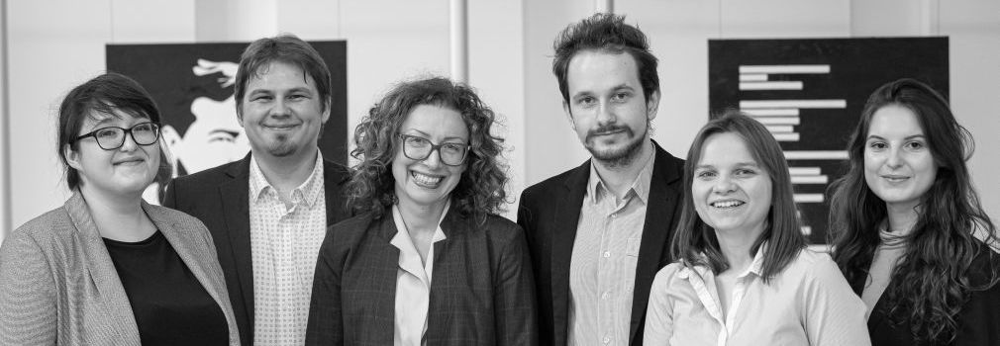

In [33]:
Image.fromarray(test_images[1])

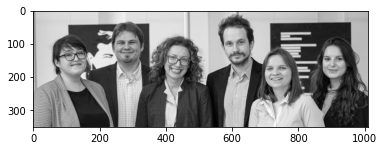

In [34]:
plt.imshow(test_images[1], cmap='gray')

In [35]:
test_images[1].shape

(350, 1010)

In [36]:
import pandas as pd
from tqdm.auto import tqdm

In [53]:
import timeit

def sliding_window(image, stepSize, windowSize):
    for y in tqdm(range(0, image.shape[0], stepSize), desc='y', leave=False):
        for x in tqdm(range(0, image.shape[1], stepSize), desc='x', leave=False):
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

            
def detect_faces(img, model, original_window=100, step_size=10, target_size=16, feature_types=['type-2-x', 'type-2-y']):
    df = pd.DataFrame(columns = ['prob', 'point_1', 'point_2'])
    start = timeit.default_timer()
#     for (x, y, window) in sliding_window(img, stepSize=step_size, windowSize=(original_window, original_window)):
#         if window.shape[0] != original_window or window.shape[1] != original_window:
#             continue
    for x in tqdm(range(0,  img.shape[0] - original_window, step_size)):
        for y in range(0, img.shape[1] - original_window, step_size):
            
            roi = img[x: x + original_window, y: y + original_window]
            
            window_resized = cv2.resize(roi, (target_size, target_size))
            ii = integral_image(window_resized)
            features = haar_like_feature(ii, 0, 0, ii.shape[0], ii.shape[1],
                                        feature_type=feature_types,
                                        feature_coord=None)
            face_pob = model.predict_proba(features.reshape(1, -1))[0, 1]

            df = df.append({'prob':face_pob, 'point_1': (y,x), 
                            'point_2':(y+original_window, x+original_window)}, ignore_index=True)

    stop = timeit.default_timer()
    print('Feature extraction took: ', stop-start)
    return df
    
def draw_boxes(img, faces_df, threshold=0.65):
    img_cp = deepcopy(img)
    
    good_candidates = faces_df[faces_df['prob'] >= threshold]
    
    for index, row in good_candidates.iterrows():
        cv2.rectangle(img_cp, row['point_1'], row['point_2'], (255,255,255), 3)
    return img_cp


In [54]:
faces_df = detect_faces(test_images[1], model_50, original_window=130)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  86.27214425299826


In [55]:
faces_df


,prob,point_1,point_2
0,0.373702,"(0, 0)","(130, 130)"
1,0.391655,"(10, 0)","(140, 130)"
2,0.352779,"(20, 0)","(150, 130)"
3,0.417022,"(30, 0)","(160, 130)"
4,0.361372,"(40, 0)","(170, 130)"
...,...,...,...
1931,0.432406,"(830, 210)","(960, 340)"
1932,0.410066,"(840, 210)","(970, 340)"
1933,0.411758,"(850, 210)","(980, 340)"
1934,0.359720,"(860, 210)","(990, 340)"


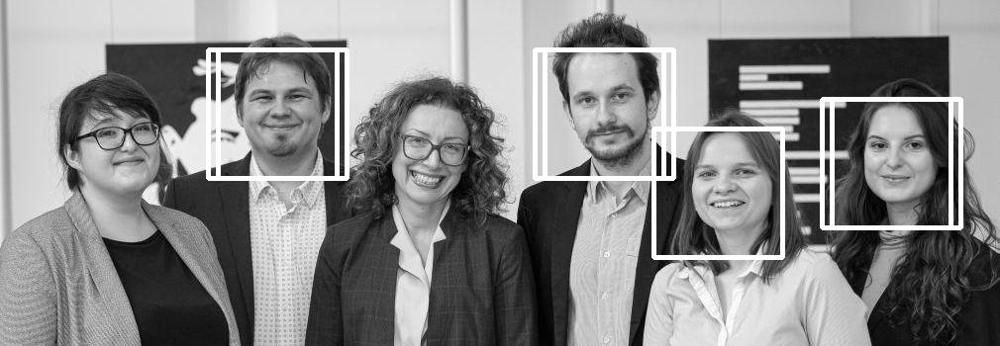

In [64]:
boxes_img = draw_boxes(test_images[1], faces_df, threshold=0.57)
Image.fromarray(cv2.cvtColor(boxes_img, cv2.COLOR_BGR2RGB))

---

#### Zadanie 4 (0.75 pkt | 0.0 pkt)

Dokonaj optymalizacji algorytmu detekcji cech.

##### Zadanie 4a (0.25 pkt)

Ze znalezionych korzeni decyzyjnych łatwo wyciągniesz indeksy cech znaczących - wykorzystaj je oraz funkcję `haar_like_feature_coord` do znalezienia podzbioru koordynat cech Haara, które następnie przekażesz do funkcji `haar_like_feature` jako parę opcjonalnych parametrów `feature_type` i `feature_coord`. Sprawdź, o ile szybciej działa teraz ekstraktor.

In [76]:
def extract_indicies(model):
    features_indices = [model.estimators_[i].tree_.feature[0] for i in range(model.n_estimators)]
    return features_indices


def extract_efective_haar_features(model, window=16, target_size=16):
    
    indices = extract_indicies(model)
    feature_types = ['type-2-x', 'type-2-y']
    feat_coord, feat_type = haar_like_feature_coord(target_size, target_size, feature_types)
    
    return feat_coord[indices], feat_type[indices]
    
    
def extract_features_optimized(img, model, window=130, step=10, target_size=16):
    start = timeit.default_timer()
    efective_feature_cord, efective_feature_types = extract_efective_haar_features(model, window, target_size)
    for x in tqdm(range(0,  img.shape[0] - window, step)):
        for y in range(0, img.shape[1] - window, step):
            
            roi = img[x: x + window, y: y + window]
            window_resized = cv2.resize(roi, (target_size, target_size))
            ii = integral_image(window_resized)
            haar_features = haar_like_feature(roi,0,0, ii.shape[0], ii.shape[1],
                                                       feature_coord = efective_feature_cord,
                                                       feature_type = efective_feature_types)
    
    
    stop = timeit.default_timer()
    print('Feature extraction took: ', stop-start)

In [77]:
extract_features_optimized(test_images[1], model_50)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  0.53960467500292


##### Zadanie 4b (0.5 pkt)

Zmodyfikuj swój klasyfikator tak, aby korzystał ze zredukowanego zbioru cech. Proponowane rozwiązania:
* (a) zmień parametr `features` w każdym z drzew, tak aby nie szukały cech w oryginalnym wektorze, a w zredukowanym,
* (b) nie zmieniaj klasyfikatora, a zamiast tego mapuj zredukowane cechy do wektora o oryginalnej długości.

Przetestuj cały pipeline na obrazach testowych.

In [82]:
from copy import deepcopy

def expand_vector(features, good_indicies, features_num):
    new_features = np.zeros((features_num))
    new_features[good_indicies] = features
    return new_features


def detect_faces_optimized(img, model, original_window=130,
                           step_size=10, target_size=16,
                           feature_types=['type-2-x', 'type-2-y']):
    
    df = pd.DataFrame(columns = ['prob', 'point_1', 'point_2'])
    
    model_features_num = model.n_features_in_
    
    start = timeit.default_timer()
    efective_feature_cord, efective_feature_types = extract_efective_haar_features(model, original_window, target_size)
    efective_feature_indicies = extract_indicies(model)
    
    for x in tqdm(range(0,  img.shape[0] - original_window, step_size)):
        for y in range(0, img.shape[1] - original_window, step_size):
            
            roi = img[x: x + original_window, y: y + original_window]
            
            window_resized = cv2.resize(roi, (target_size, target_size))
            ii = integral_image(window_resized)
            features = haar_like_feature(ii, 0, 0, ii.shape[0], ii.shape[1],
                                        feature_type=efective_feature_types,
                                        feature_coord=efective_feature_cord)
            
            features = expand_vector(features, efective_feature_indicies, model_features_num)
            face_pob = model.predict_proba(features.reshape(1, -1))[0, 1]

            df = df.append({'prob':face_pob, 'point_1': (y,x), 
                            'point_2':(y+original_window, x+original_window)}, ignore_index=True)

    stop = timeit.default_timer()
    print('Feature extraction took: ', stop-start)
    return df

### Test images 

In [91]:
faced_df_0 = detect_faces_optimized(test_images[0],  model_50, original_window=100, step_size=10)

  0%|          | 0/76 [00:00<?, ?it/s]

Feature extraction took:  99.13330644600137


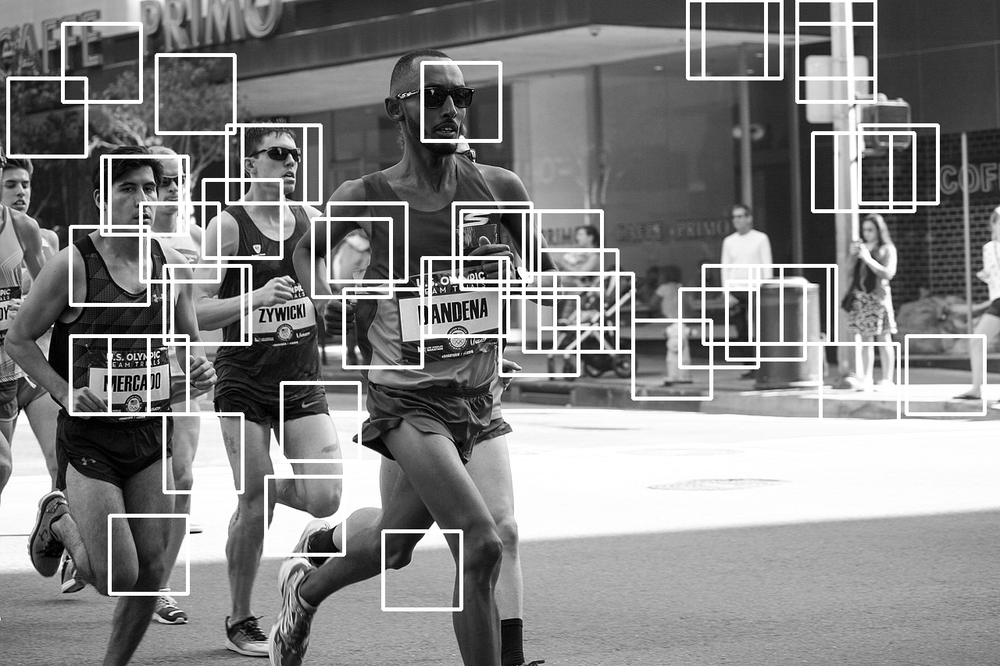

In [96]:
boxes_0 = draw_boxes(test_images[0], faced_df_0, threshold=0.52)
Image.fromarray(cv2.cvtColor(boxes_0, cv2.COLOR_BGR2RGB))

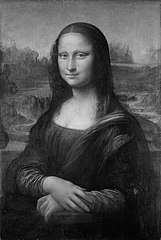

In [119]:
Image.fromarray(test_images[4])

In [100]:
faced_df_2 = detect_faces_optimized(test_images[2],  model_50, original_window=200, step_size=10)

  0%|          | 0/49 [00:00<?, ?it/s]

Feature extraction took:  35.5266919559981


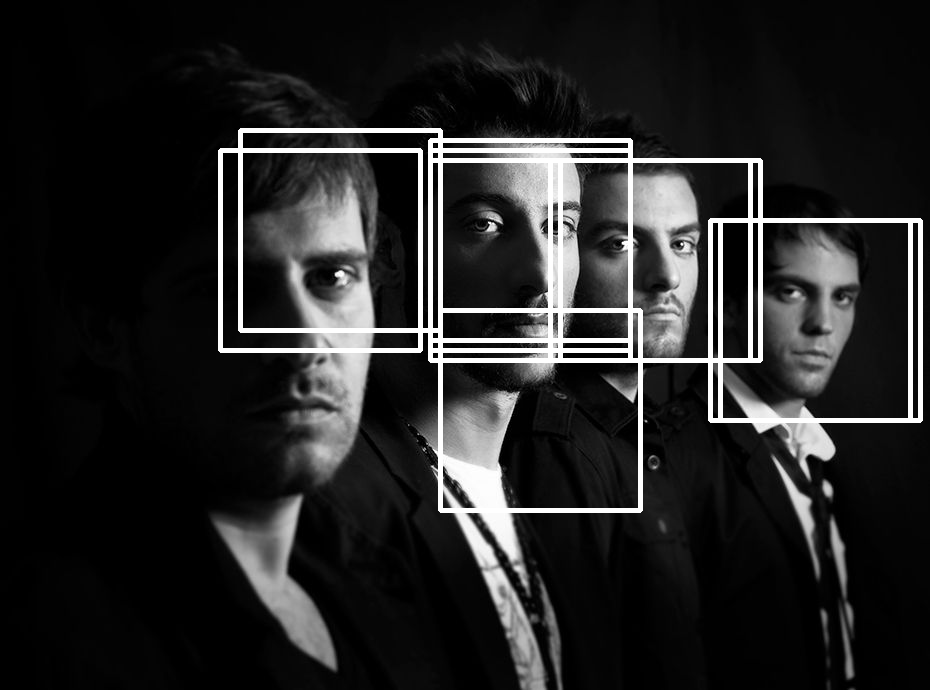

In [109]:
boxes_2 = draw_boxes(test_images[2], faced_df_2, threshold=0.55)
Image.fromarray(cv2.cvtColor(boxes_2, cv2.COLOR_BGR2RGB))

In [112]:
faced_df_3 = detect_faces_optimized(test_images[3],  model_50, original_window=180, step_size=10)

  0%|          | 0/102 [00:00<?, ?it/s]

Feature extraction took:  63.752647048000654


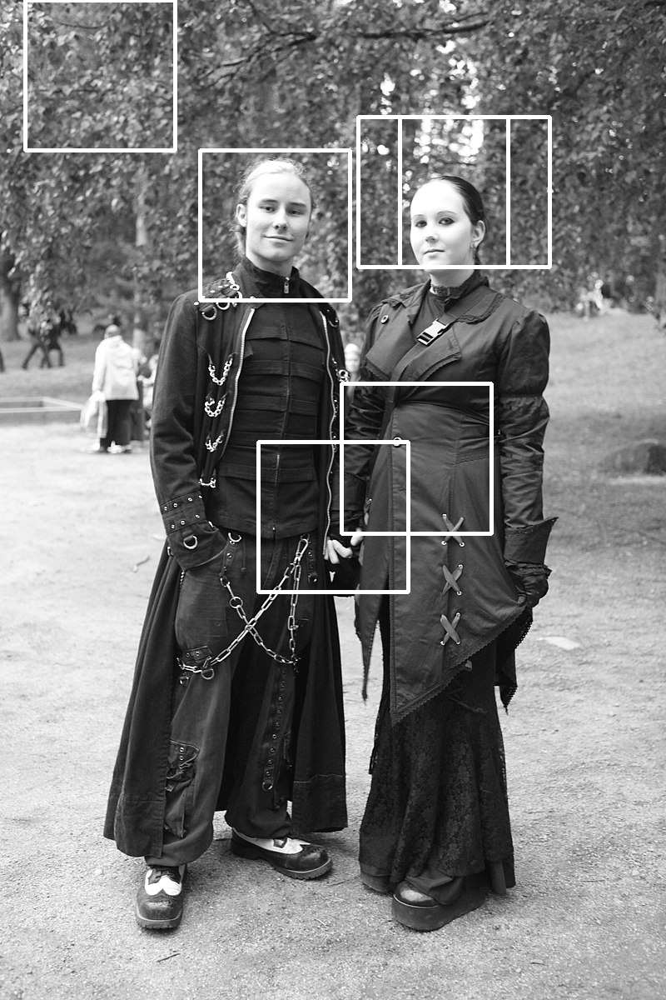

In [115]:
boxes_3 = draw_boxes(test_images[3], faced_df_3, threshold=0.55)
Image.fromarray(cv2.cvtColor(boxes_3, cv2.COLOR_BGR2RGB))

In [120]:
faced_df_4 = detect_faces_optimized(test_images[4],  model_50, original_window=50, step_size=5)

  0%|          | 0/38 [00:00<?, ?it/s]

Feature extraction took:  8.921801003998553


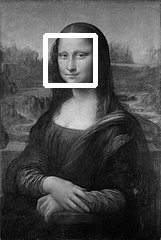

In [125]:
boxes_4 = draw_boxes(test_images[4], faced_df_4, threshold=0.59)
Image.fromarray(cv2.cvtColor(boxes_4, cv2.COLOR_BGR2RGB))

In [126]:
faced_df_5 = detect_faces_optimized(test_images[5],  model_50, original_window=80, step_size=5)

  0%|          | 0/104 [00:00<?, ?it/s]

Feature extraction took:  174.6414978110006


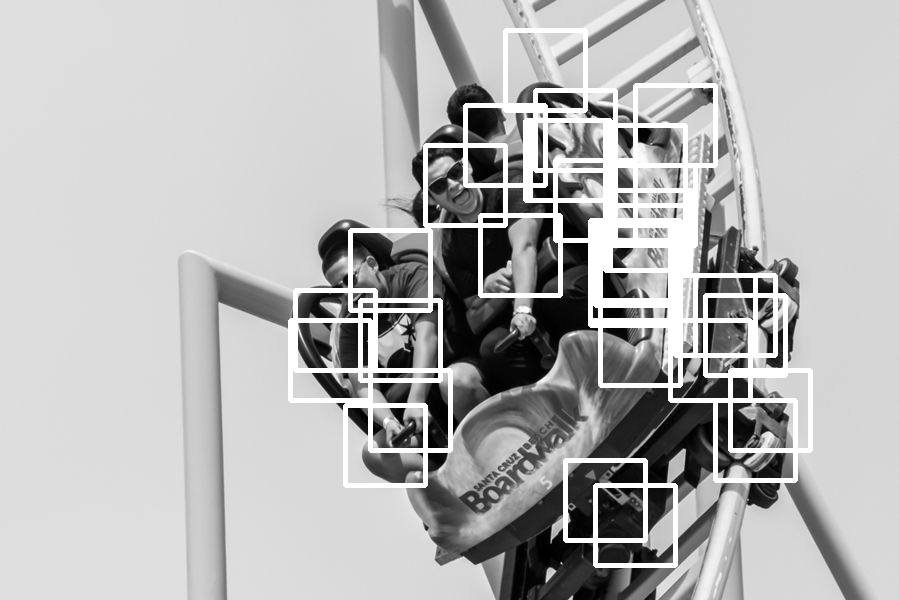

In [134]:
boxes_5 = draw_boxes(test_images[5], faced_df_5, threshold=0.53)
Image.fromarray(cv2.cvtColor(boxes_5, cv2.COLOR_BGR2RGB))

---

#### Zadanie 5 (0.0 pkt | 1.0 pkt)

Wykonaj testy jakości detekcji dla klasyfikatorów o różnej liczbie cech. Wyniki omów, komentując mocne i słabe strony metody - ilościowe miary jakości nie są istotne (m.in. z tego powodu zbiór testowy jest tak niewielki i nie ma etykiet).

Wykonaj testy wydajnościowe różnych klasyfikatorów. Dla porównania uwzględnij przynajmniej jeden przed optymalizacją ekstrakcji cech. Wyniki przedstaw w formie tabeli, mierząc średni czas przetwarzania jednego obrazu.



In [135]:
models = [
    train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=5, print_output=False),
    train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=10, print_output=False),
    train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=25, print_output=False),
    train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=50, print_output=False),
    train_classifier(X_train_cp, y_train_cp, X_val_cp, y_val_cp, n_estimators=100, print_output=False),
]

F1 - train:  0.9416393442622951
F1 - val:  0.9290060851926977
------------------------------------------
F1 - train:  0.9757412398921833
F1 - val:  0.9568788501026694
------------------------------------------
F1 - train:  1.0
F1 - val:  0.9695740365111561
------------------------------------------
F1 - train:  1.0
F1 - val:  0.9838056680161943
------------------------------------------
F1 - train:  1.0
F1 - val:  0.991869918699187
------------------------------------------


In [136]:
models_df = pd.DataFrame(columns=['optimized', 'model_size', 'training_time', 'inference_time_mean', 'inference_time_std'])

### model 5 - brak optymalizacji

In [137]:
times = []
for _ in range(5):
    start = timeit.default_timer()
    model_5_haar_non_optimized = detect_faces(test_images[1], models[0][0], original_window= 130)
    stop = timeit.default_timer()

    duration = stop - start
    times.append(duration)

models_df = models_df.append({'optimized': False, 'model_size':5,
                             'training_time': models[0][1],
                             'inference_time_mean':np.mean(times),
                             'inference_time_std': np.std(times)}, ignore_index=True)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  73.78001226999913


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  80.25923678600157


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  80.17636289499933


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  85.69099436500255


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  78.80118020300142


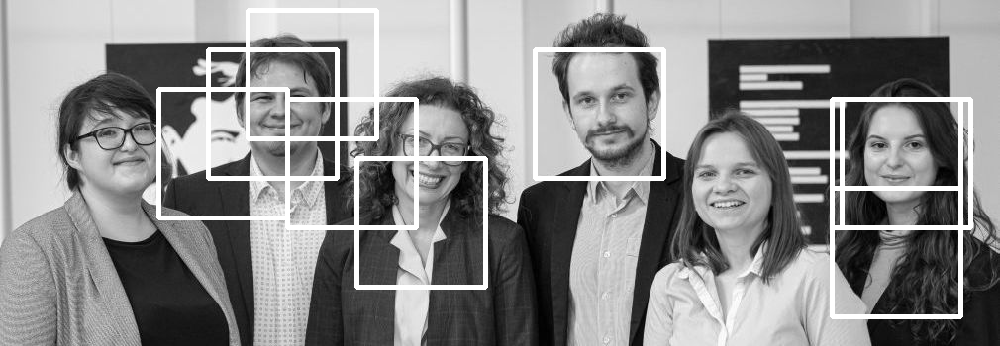

In [150]:
boxes_5_nooptimized = draw_boxes(test_images[1], model_5_haar_non_optimized, threshold=0.76)
Image.fromarray(cv2.cvtColor(boxes_5_nooptimized, cv2.COLOR_BGR2RGB))

### model 5 - optymalizacja

In [155]:
times = []
for _ in range(5):
    start = timeit.default_timer()
    model_5_haar = detect_faces_optimized(test_images[1],  models[0][0], original_window=130)
    stop = timeit.default_timer()

    duration = stop - start
    times.append(duration)

models_df = models_df.append({'optimized': True, 'model_size':5,
                             'training_time': models[0][1],
                             'inference_time_mean':np.mean(times),
                             'inference_time_std': np.std(times)}, ignore_index=True)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  5.75206208599775


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  5.907095376998768


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  5.701627634000033


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  6.031720424001833


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  5.6515208249984425


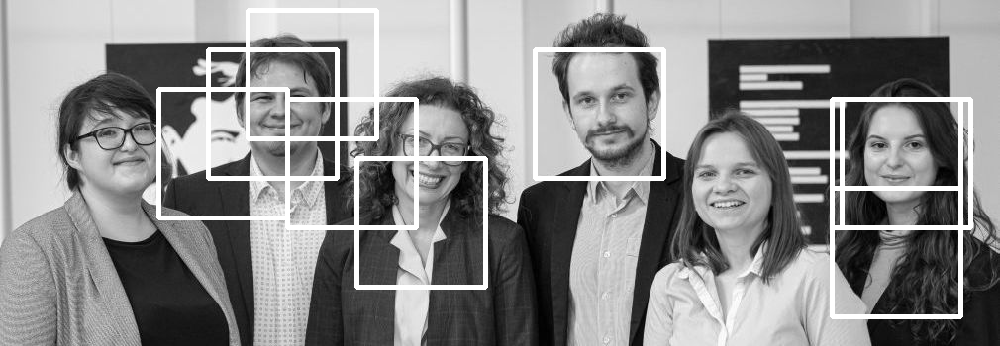

In [160]:
boxes_5_optimized = draw_boxes(test_images[1], model_5_haar, threshold=0.76)
Image.fromarray(cv2.cvtColor(boxes_5_optimized, cv2.COLOR_BGR2RGB))

### model 10 - optimized

In [162]:
times = []
for _ in range(5):
    start = timeit.default_timer()
    model_10_haar = detect_faces_optimized(test_images[1],  models[1][0], original_window=130)
    stop = timeit.default_timer()

    duration = stop - start
    times.append(duration)

models_df = models_df.append({'optimized': True, 'model_size':10,
                             'training_time': models[1][1],
                             'inference_time_mean':np.mean(times),
                             'inference_time_std': np.std(times)}, ignore_index=True)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  7.727228708001348


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  7.2712787489981565


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  7.8533231020010135


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  7.255746240996814


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  7.192160059999878


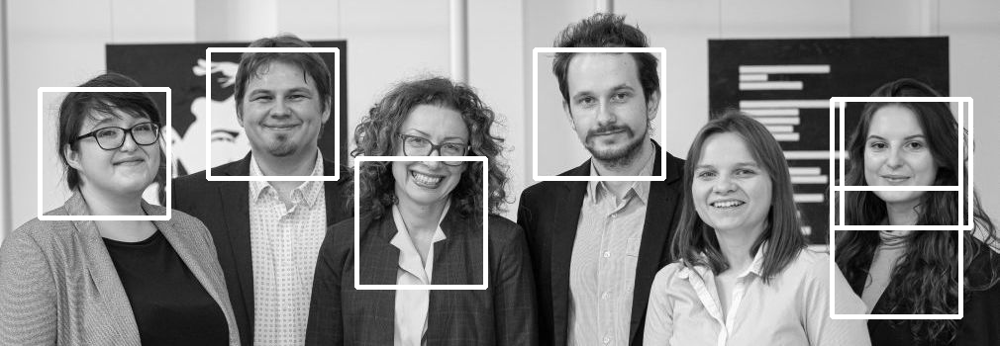

In [175]:
boxes_10_optimized = draw_boxes(test_images[1], model_10_haar, threshold=0.68)
Image.fromarray(cv2.cvtColor(boxes_10_optimized, cv2.COLOR_BGR2RGB))

### model 25 - optimized


In [177]:
times = []
for _ in range(5):
    start = timeit.default_timer()
    model_25_haar = detect_faces_optimized(test_images[1],  models[2][0], original_window=130)
    stop = timeit.default_timer()

    duration = stop - start
    times.append(duration)

models_df = models_df.append({'optimized': True, 'model_size':25,
                             'training_time': models[2][1],
                             'inference_time_mean':np.mean(times),
                             'inference_time_std': np.std(times)}, ignore_index=True)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  12.057238836001488


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  11.565866498000105


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  11.544229889001144


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  11.592183883996768


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  11.462820266002382


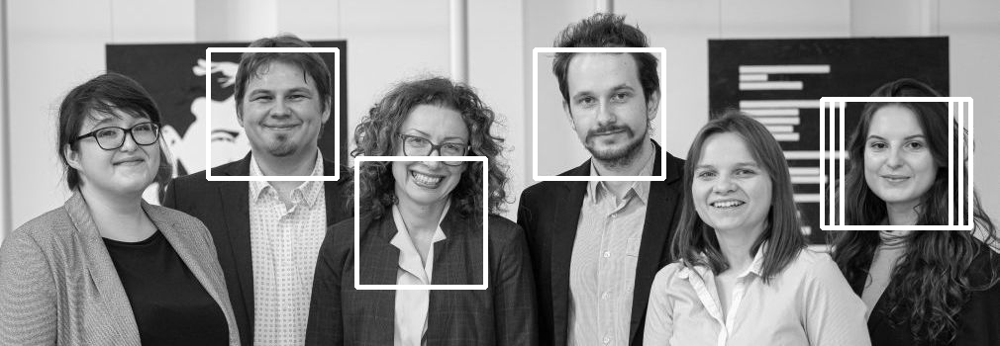

In [188]:
boxes_25_optimized = draw_boxes(test_images[1], model_25_haar, threshold=0.60)
Image.fromarray(cv2.cvtColor(boxes_25_optimized, cv2.COLOR_BGR2RGB))

### model 50 - optimized

In [190]:
times = []
for _ in range(5):
    start = timeit.default_timer()
    model_50_haar = detect_faces_optimized(test_images[1],  models[3][0], original_window=130)
    stop = timeit.default_timer()

    duration = stop - start
    times.append(duration)

models_df = models_df.append({'optimized': True, 'model_size':50,
                             'training_time': models[3][1],
                             'inference_time_mean':np.mean(times),
                             'inference_time_std': np.std(times)}, ignore_index=True)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  18.397416155999963


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  18.198337424000783


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  18.37507890299821


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  18.07476818500072


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  18.282215414998063


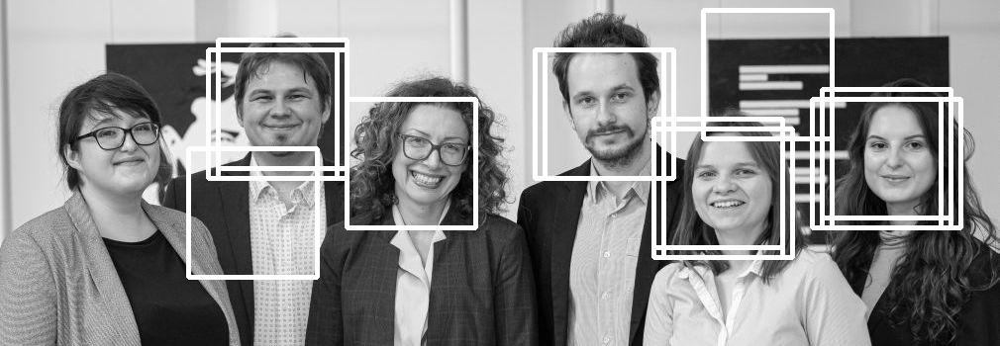

In [200]:
boxes_50_optimized = draw_boxes(test_images[1], model_50_haar, threshold=0.54)
Image.fromarray(cv2.cvtColor(boxes_50_optimized, cv2.COLOR_BGR2RGB))

### model 100 - optimized

In [201]:
times = []
for _ in range(5):
    start = timeit.default_timer()
    model_100_haar = detect_faces_optimized(test_images[1],  models[4][0], original_window=130)
    stop = timeit.default_timer()

    duration = stop - start
    times.append(duration)

models_df = models_df.append({'optimized': True, 'model_size':100,
                             'training_time': models[4][1],
                             'inference_time_mean':np.mean(times),
                             'inference_time_std': np.std(times)}, ignore_index=True)

  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  35.08827776199905


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  37.415662495001015


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  35.16862191400287


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  35.53849025699674


  0%|          | 0/22 [00:00<?, ?it/s]

Feature extraction took:  35.545321642999625


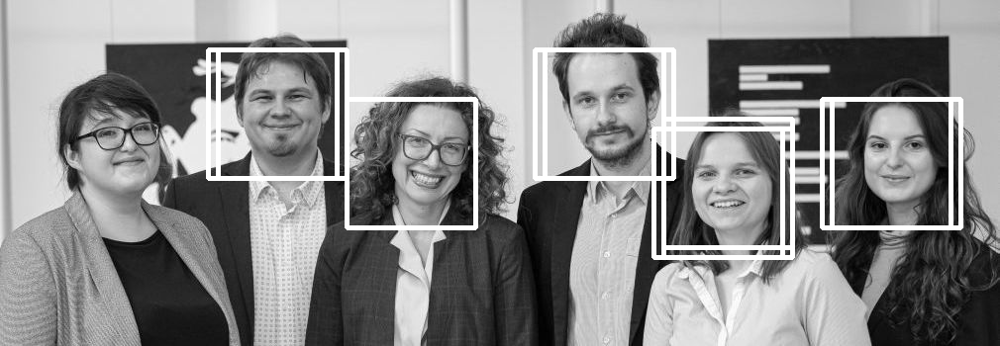

In [208]:
boxes_100_optimized = draw_boxes(test_images[1], model_100_haar, threshold=0.55)
Image.fromarray(cv2.cvtColor(boxes_100_optimized, cv2.COLOR_BGR2RGB))

In [209]:
models_df

,optimized,model_size,training_time,inference_time_mean,inference_time_std
0,False,5,12.271798,79.743322,3.802080
1,True,5,12.271798,5.810278,0.140501
2,True,10,24.055829,7.461221,0.273933
3,True,25,63.253850,11.646070,0.210733
4,True,50,117.299640,18.267046,0.118944
5,True,100,224.017963,35.752939,0.853119


#### Zadanie 6 (0.0 pkt | 0.5 pkt)

Wykorzystaj dowolny znaleziony w internecie model głębokiej sieci neuronowej do detekcji twarzy, np. [https://github.com/timesler/facenet-pytorch](https://github.com/timesler/facenet-pytorch), porównując jego działanie z uzyskanymi w trakcie laboratorium klasyfikatorami pod względem jakości detekcji i szybkości działania.

In [210]:
!pip install facenet-pytorch

     |████████████████████████████████| 1.9 MB 1.6 MB/s eta 0:00:01
  Using cached requests-2.26.0-py2.py3-none-any.whl (62 kB)
  Using cached torchvision-0.11.1-cp38-cp38-manylinux1_x86_64.whl (23.3 MB)
  Using cached idna-3.3-py3-none-any.whl (61 kB)
  Using cached certifi-2021.10.8-py2.py3-none-any.whl (149 kB)
  Using cached urllib3-1.26.7-py2.py3-none-any.whl (138 kB)
  Using cached torch-1.10.0-cp38-cp38-manylinux1_x86_64.whl (881.9 MB)
  Attempting uninstall: torch
    Found existing installation: torch 1.9.1
    Uninstalling torch-1.9.1:
      Successfully uninstalled torch-1.9.1


In [211]:
from facenet_pytorch import MTCNN, InceptionResnetV1
import torch

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))

Running on device: cpu


In [212]:
mtcnn = MTCNN(keep_all=True, device=device)

In [213]:
def detect_faces_dnn(image, model):
    times = []
    for _ in range(5):
        start = timeit.default_timer()
        boxes, _ = model.detect(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))
        
        stop = timeit.default_timer()
        duration = stop - start
        times.append(duration)
    
    
    image_copy = deepcopy(image)
    for box in boxes:
        cv2.rectangle(image_copy, 
                      (int(box[0]), int(box[1])), 
                      (int(box[2]), int(box[3])), 
                      (255, 255, 0), 5)
        
    return Image.fromarray(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)), times

Time mean:  0.2829360037998413
Time std:  0.022815505917444415


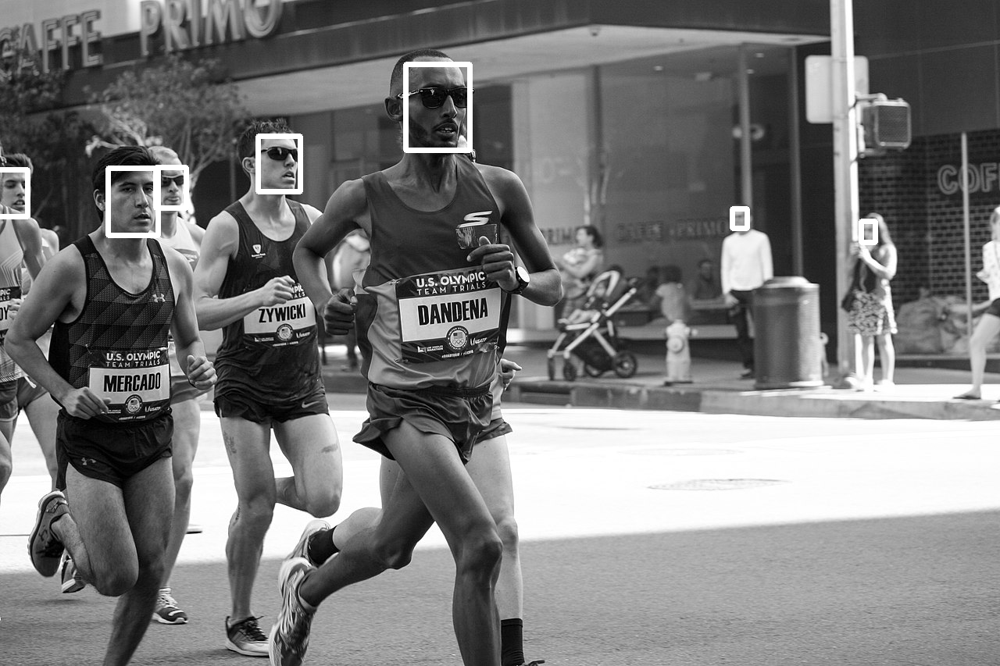

In [215]:
res, times = detect_faces_dnn(test_images[0], mtcnn)

print('Time mean: ',np.mean(times))
print('Time std: ',np.std(times))
res

Time mean:  0.10964513720027753
Time std:  0.009562126067335959


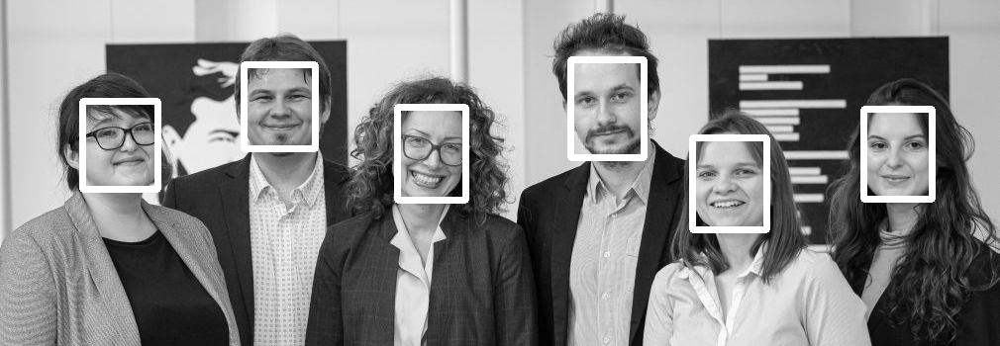

In [216]:
res, times = detect_faces_dnn(test_images[1], mtcnn)

print('Time mean: ',np.mean(times))
print('Time std: ',np.std(times))
res

Time mean:  0.15582908159994985
Time std:  0.019403642431514642


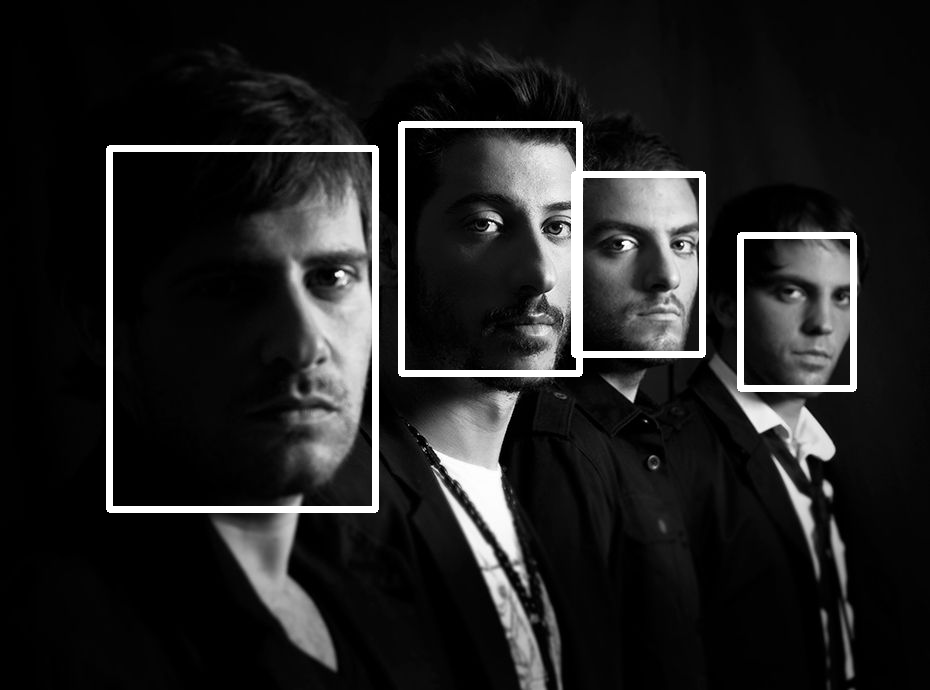

In [217]:
res, times = detect_faces_dnn(test_images[2], mtcnn)

print('Time mean: ',np.mean(times))
print('Time std: ',np.std(times))
res

Time mean:  0.31373752299914487
Time std:  0.02608409083004638


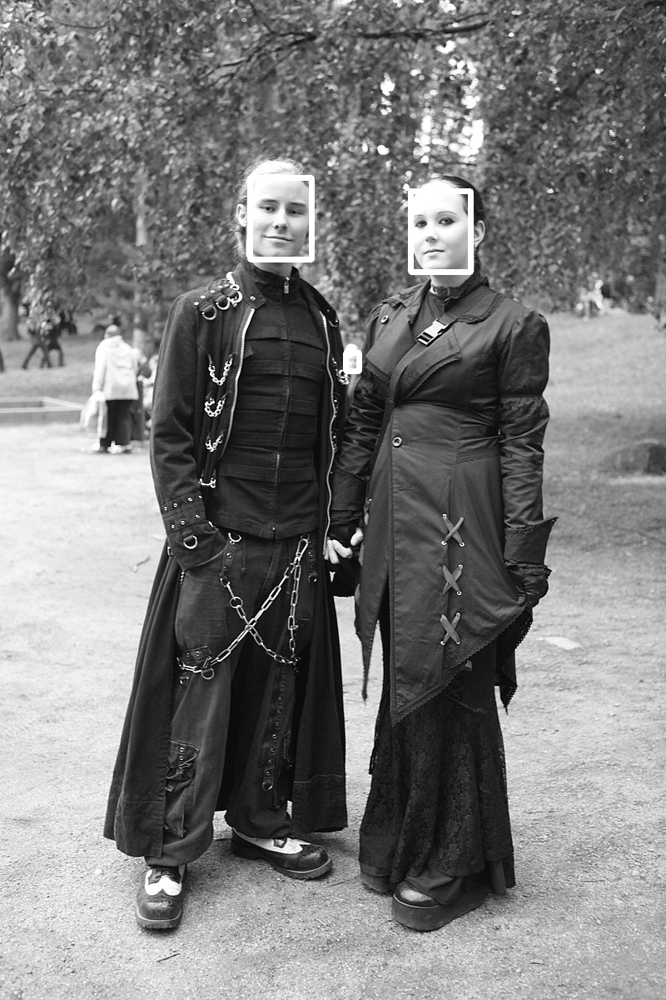

In [218]:
res, times = detect_faces_dnn(test_images[3], mtcnn)

print('Time mean: ',np.mean(times))
print('Time std: ',np.std(times))
res

Time mean:  0.028818258000683272
Time std:  0.002265250860292341


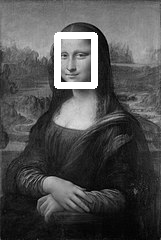

In [219]:
res, times = detect_faces_dnn(test_images[4], mtcnn)

print('Time mean: ',np.mean(times))
print('Time std: ',np.std(times))
res

Time mean:  0.11744835059871547
Time std:  0.013201373498121763


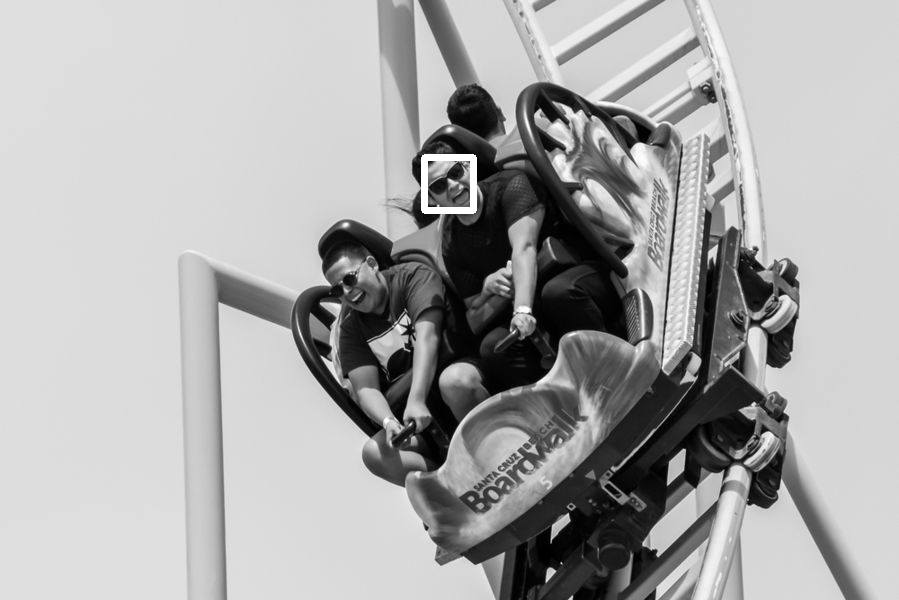

In [220]:
res, times = detect_faces_dnn(test_images[5], mtcnn)

print('Time mean: ',np.mean(times))
print('Time std: ',np.std(times))
res